# Imports

In [1]:
import requests
import shutil
import os

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import random
import cv2
import sys
from PIL import Image
import matplotlib.image as mpimg

%matplotlib inline

In [3]:
!pip install -q --upgrade torch torchvision

In [5]:
import torch.nn as nn
import torch
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import balanced_accuracy_score, f1_score, accuracy_score, recall_score, precision_score

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
drive_data_dir = '/content/drive/MyDrive/Colab Notebooks/nsfw_classification/dataset'

Mounted at /content/drive


# 1.Creating dataset

## 1.1.Kaggle API

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()  # upload here kaggle.json file to use kaggle API

In [ ]:
# !mkdir ./kaggle
# !cp kaggle.json ./kaggle
# !chmod 600 ./kaggle/kaggle.json
# !kaggle datasets download -d amloii/nsfw-images-in-review
# !cp /content/nsfw-images-in-review.zip /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification
# !unzip /content/nsfw-images-in-review.zip -q

100% 11.3G/11.3G [08:55<00:00, 20.1MB/s]
100% 11.3G/11.3G [08:55<00:00, 22.7MB/s]
Archive:  /content/nsfw-images-in-review.zip
caution: filename not matched:  -q


In [ ]:
!unzip /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification/nsfw-images-in-review.zip

In [ ]:
a, b = len(os.listdir('/content/data/train/porn')), len(os.listdir('/content/data/test/porn'))
a, b, a + b

(17808, 4000, 21808)

In [ ]:
a, b = len(os.listdir('/content/data/train/neutral')), len(os.listdir('/content/data/test/neutral'))
a, b, a + b

(9264, 2525, 11789)

In [ ]:
def move_to_drive(src, label,
                  destination=drive_data_dir, 
                  limit=4000):
  cnt = 0
  for img in tqdm(os.listdir(src), total=min(len(os.listdir(src)), limit)):    
    shutil.move(os.path.join(src, img), 
                os.path.join(destination, label + '_0' + img))
    cnt += 1
    if cnt == limit:
      return  

In [ ]:
for dir in ['/content/data/train/porn', '/content/data/test/porn', 
            '/content/data/train/neutral', '/content/data/test/neutral']:
  move_to_drive(dir, label=dir.split('/')[-1])  

100%|██████████| 2525/2525 [00:54<00:00, 46.47it/s]


## 1.2.Caltech images

In [ ]:
caltech_data = torchvision.datasets.Caltech101('caltech', download=True)

0it [00:00, ?it/s]

Extracting caltech/caltech101/101_ObjectCategories.tar.gz to caltech/caltech101


0it [00:00, ?it/s]

Extracting caltech/caltech101/Annotations.tar to caltech/caltech101


In [ ]:
def caltech_dir_info(path, img_to_plot=30):
  print(len(os.listdir(path)))
  for i, img_file in enumerate(os.listdir(path)):
    img = np.array(Image.open(path + img_file).convert('RGB'))
    to_PIL = transforms.ToPILImage()
    plt.figure()
    plt.imshow(to_PIL(img))
    plt.axis('off')
    plt.show()
    if i == img_to_plot:
      break

468


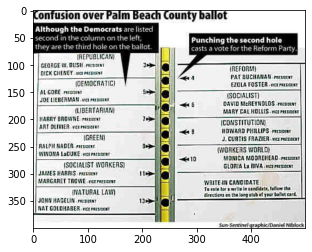

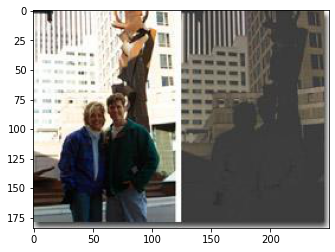

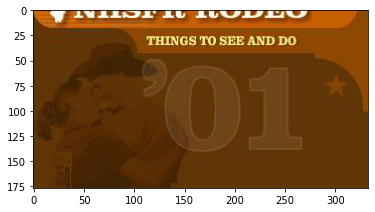

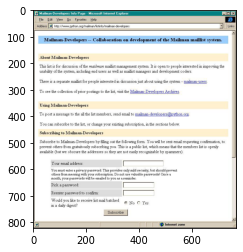

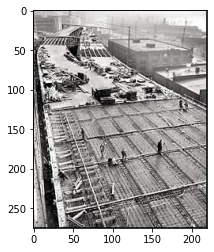

...

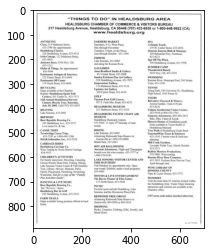

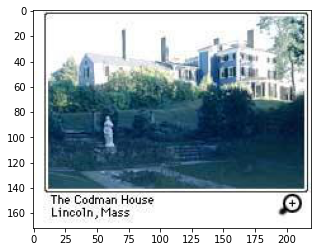

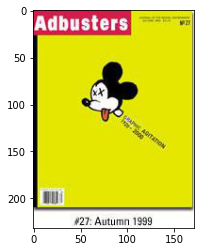

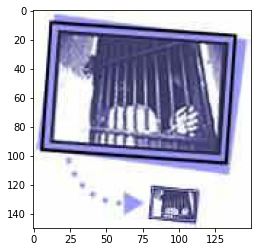

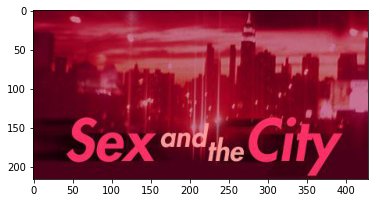

In [ ]:
caltech_dir = '/content/caltech/caltech101/101_ObjectCategories/BACKGROUND_Google/'
caltech_dir_info(caltech_dir)

435


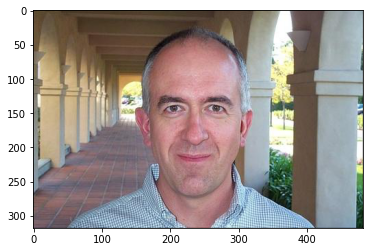

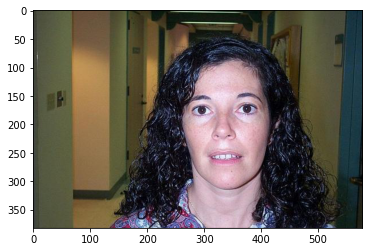

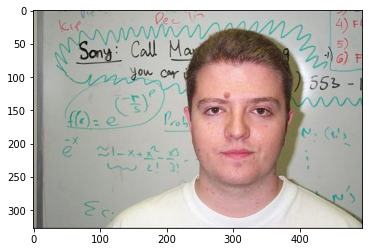

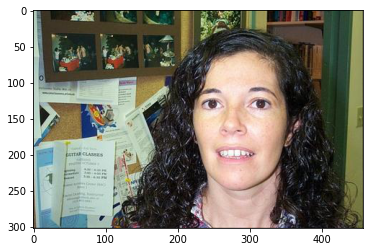

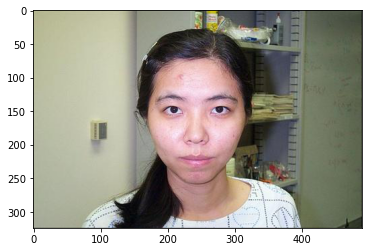

...

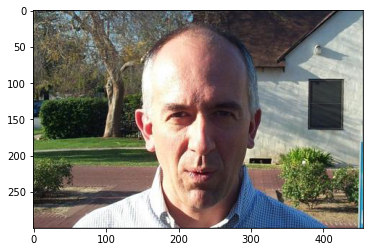

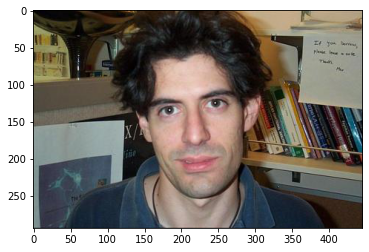

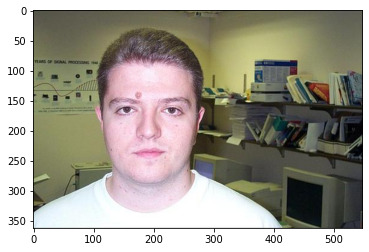

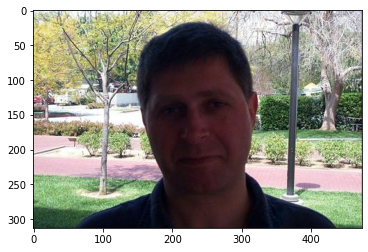

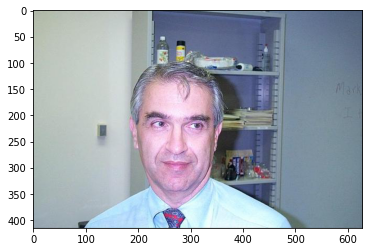

In [ ]:
caltech_faces_dir = '/content/caltech/caltech101/101_ObjectCategories/Faces/'
caltech_dir_info(caltech_faces_dir, 10)

81


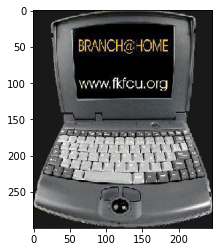

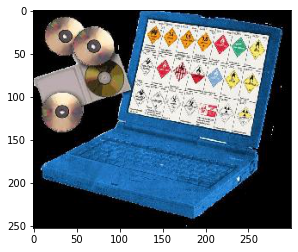

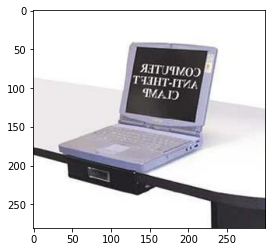

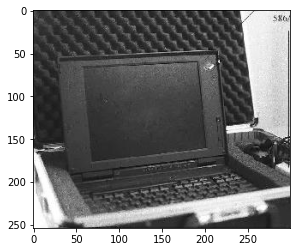

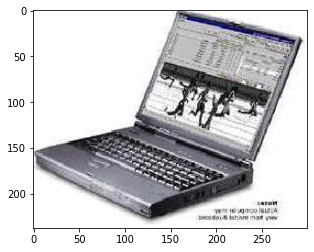

...

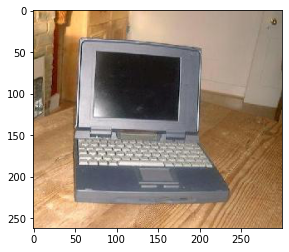

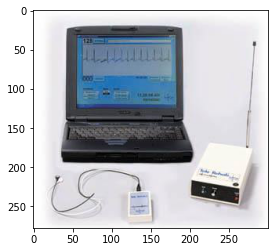

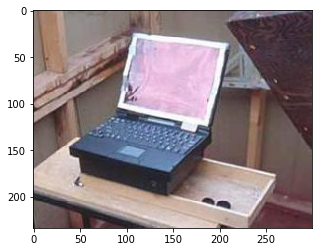

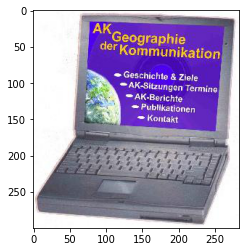

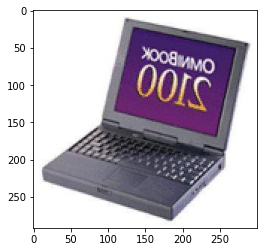

In [ ]:
caltech_laptop_dir = '/content/caltech/caltech101/101_ObjectCategories/laptop/'
caltech_dir_info(caltech_laptop_dir, 5)

In [ ]:
for dir in ['BACKGROUND_Google', 'Faces', 
            'airplanes', 'camera', 'laptop']:
  path = '/content/caltech/caltech101/101_ObjectCategories/' + dir
  move_to_drive(path, label='neutral_' + dir)

100%|██████████| 81/81 [00:00<00:00, 91.23it/s]


In [ ]:
print('Total:', len(os.listdir(drive_data_dir)))

16898

In [ ]:
print('neutral:', len([f for f in os.listdir(drive_data_dir) if f.startswith('neutral')]))

8898

In [ ]:
print('nsfw:', len([f for f in os.listdir(drive_data_dir) if f.startswith('porn')]))

8000

## 1.3.github dataset

Source: https://github.com/alex000kim/nsfw_data_scraper

In [ ]:
# !unzip -q /content/drive/MyDrive/Colab\ Notebooks/NIS/data.zip
!cp /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification/urls_hentai.txt /content/
!cp /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification/urls_neutral.txt /content/
# !cp /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification/urls_porn.txt /content/
# !cp /content/drive/MyDrive/Colab\ Notebooks/nsfw_classification/urls_sexy.txt /content/

In [ ]:
[f for f in os.listdir() if f.startswith('urls')]

['urls_neutral.txt', 'urls_hentai.txt', 'urls_sexy.txt', 'urls_porn.txt']

In [ ]:
with open('urls_neutral.txt', 'r') as file:
  print(len(file.readlines()))

36837


In [ ]:
url_files = ['urls_neutral.txt', 'urls_hentai.txt'] 
cur_dir = os.getcwd()
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/53.0.2785.116 Safari/537.36 OPR/40.0.2308.81',
    'Connection': 'close'
}
for x in url_files:
  bad_img_cnt = 0
  dir_name = drive_data_dir 
  if not os.path.exists(dir_name):
    os.mkdir(dir_name)
  with open(x, 'r') as file:
    cnt = 0
    num_lines = len(file.readlines())
    file.seek(0)
    for line in tqdm(file, total=min(num_lines, 700)):
      url = line.strip()
      try:
        res = requests.get(url, headers=headers, stream=True)
      except:
        bad_img_cnt += 1
        continue
      if res.status_code == 200:
        cnt += 1
        if 'neutral' in x:
          file_name = os.path.join(dir_name, 'neutral' + '_' + str(cnt) + '.jpg')
        else:
          file_name = os.path.join(dir_name, 'porn' + '_' + str(cnt) + '.jpg')
        with open(file_name, 'wb') as f:
          shutil.copyfileobj(res.raw, f)
      else:
        bad_img_cnt += 1
      if cnt == 700:
        break
  print(f'Total images that could not be downloaded from {x}: {bad_img_cnt}')

713it [04:33,  2.61it/s]


Total images that could not be downloaded from urls_neutral.txt: 14


702it [11:43,  1.00s/it]

Total images that could not be downloaded from urls_hentai.txt: 3


In [ ]:
print('Total:', len(os.listdir(drive_data_dir)))
print('neutral:', len([f for f in os.listdir(drive_data_dir) if f.startswith('neutral')]))
print('nsfw:', len([f for f in os.listdir(drive_data_dir) if f.startswith('porn')]))

Total: 17664
neutral: 8964
nsfw: 8700


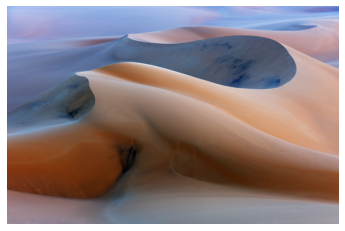

In [ ]:
image = mpimg.imread(os.path.join(drive_data_dir, 'neutral_5.jpg'))
# image = cv2.cvtColor(cv2.imread('neutral/20.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

There are some corrupted files, we'll drop them to avoid further errors

In [ ]:
for img_file in os.listdir(drive_data_dir):
  try:
    mpimg.imread(os.path.join(drive_data_dir, img_file))
  except:
    print(f'removing file {img_file}')
    os.remove(os.path.join(drive_data_dir, img_file))

removing file porn_33.jpg
removing file porn_34.jpg
removing file porn_629.jpg
removing file porn_630.jpg
removing file porn_631.jpg
removing file porn_632.jpg
removing file porn_633.jpg
removing file porn_634.jpg
removing file porn_635.jpg
removing file porn_636.jpg
removing file porn_637.jpg
removing file porn_638.jpg
removing file porn_639.jpg
removing file porn_640.jpg
removing file porn_641.jpg
removing file porn_642.jpg
removing file porn_643.jpg
removing file porn_644.jpg


Manually deleted around 100 unavailable images from imgur or controversial images

# 2.DL

## 2.1.Creating torch Dataset and Dataloader + train/test split

In [ ]:
import pandas as pd
df = pd.DataFrame({'count': [len([f for f in os.listdir(drive_data_dir) if f.startswith('neutral')]),
                             len([f for f in os.listdir(drive_data_dir) if f.startswith('porn')])]})
df.index = ['neutral', 'nsfw']
df

,count
neutral,8959
nsfw,8602


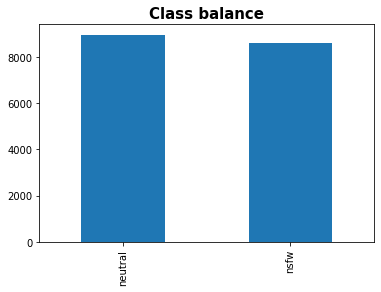

In [ ]:
df['count'].plot(kind='bar')
plt.title('Class balance', weight='bold', fontsize=15)
plt.show()

In [ ]:
def seed_everything(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
  
seed_everything(42)

In [ ]:
classes = ['neutral', 'porn']
classes_dict = {v: k for k, v in enumerate(classes)}
classes_dict

{'neutral': 0, 'porn': 1}

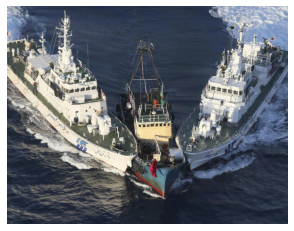

In [ ]:
plt.imshow(np.array(Image.open('/content/drive/MyDrive/Colab Notebooks/nsfw_classification/dataset/neutral_54.jpg').convert('RGB')))
plt.axis('off')
plt.show()

In [ ]:
class CustomDataset(Dataset):    
    def __init__(self, data_dir, transform=None):
        """
        Args:
            data_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                                            on a sample.
        """
        self.data_dir = data_dir
        self.transform = transform
        self.files_lst = list(map(lambda x: os.path.join(data_dir, x), os.listdir(data_dir)))
        
    def __len__(self):
        return len(self.files_lst)
    
    def __getitem__(self, idx):      
        img_path = self.files_lst[idx]
        label = classes_dict[img_path.split('/')[-1].split('_')[0]]
        img = np.array(Image.open(img_path).convert('RGB'))
        if len(img.shape) == 2:
          img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        if self.transform:
            img = self.transform(img / 255.0)
        return (img, label)   

In [ ]:
transform = transforms.Compose([
  transforms.ToTensor(),
  transforms.Resize((224, 224)),
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation(30),
  transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.01, 0.8))
])

In [ ]:
dataset = CustomDataset(drive_data_dir, transform)  # создадим instance датасета

In [ ]:
len(dataset)

17561

Here's what outputs of our dataset look like

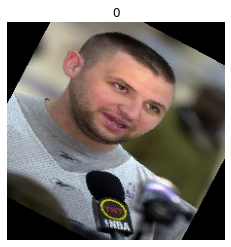

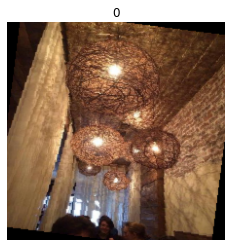

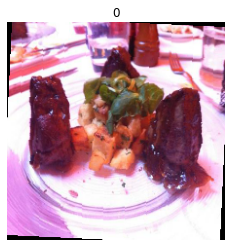

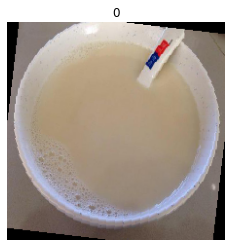

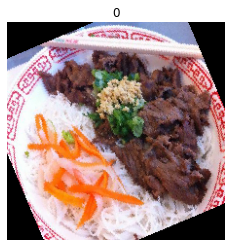

...

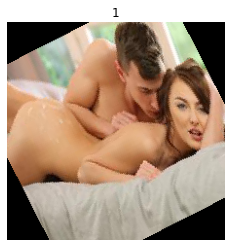

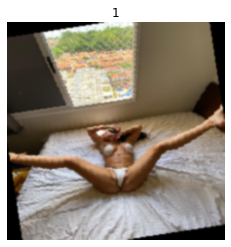

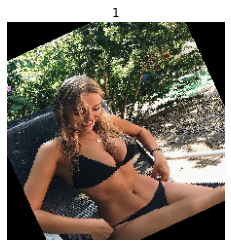

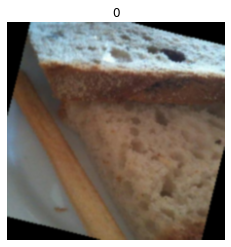

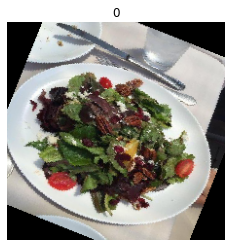

In [ ]:
for _ in range(15):
  img, lab = dataset[np.random.randint(len(dataset))]
  to_PIL = transforms.ToPILImage()
  plt.figure()
  plt.imshow(to_PIL(img))
  plt.title(lab)
  plt.axis('off')
  plt.show()

Now we shall split our data into train, val and test sets. I'll pick proportion of 70/15/15

In [ ]:
train_size = int(0.7 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
test_size = int(val_size * 0.5)
val_size = val_size - test_size
val_dataset, test_dataset = torch.utils.data.random_split(val_dataset, [val_size, test_size])

In [ ]:
train_size, val_size, test_size

(12292, 2635, 2634)

In [ ]:
trainloader = DataLoader(train_dataset, batch_size=8,
                         shuffle=True, num_workers=2)
valloader = DataLoader(val_dataset, batch_size=8,
                       shuffle=False, num_workers=2)
testloader = DataLoader(test_dataset, batch_size=8,
                        shuffle=False, num_workers=2)

## 2.2.Pretrained model download

Since there are only 2 classes, I'm dealing with medium-sized dataset and I would like to avoid long inference, I'm going to choose something not too heavy, but still efficient.  
I think, small version of ResNet is a good pick here.

In [ ]:
from torchvision.models import resnet18

model = resnet18(pretrained=True)
# model

**Let's freeze weights (except for the last linear layer)**

In [ ]:
for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Linear(512, len(classes))

## 2.3.Fine-tuning model

Implementation of train loop

In [ ]:
def train_epoch(model, data_loader, optimizer, criterion,
                return_losses=False, device='cuda:0', scheduler=None):
    model = model.to(device).train()
    total_loss = 0
    num_batches = 0
    all_losses = []
    total_predictions = np.array([])
    total_labels = np.array([])
    with tqdm(total=len(data_loader), file=sys.stdout) as prbar:
        for images, labels in data_loader:
            # Move Batch to GPU
            images = images.float().to(device)
            labels = labels.to(device)
            predicted = model(images)
            loss = criterion(predicted, labels)
            # Update weights
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
            total_loss += loss.item()
            total_predictions = np.append(total_predictions, predicted.argmax(1).cpu().detach().numpy())
            total_labels = np.append(total_labels, labels.cpu().detach().numpy())
            num_batches += 1
            all_losses.append(loss.detach().item())

            prbar.set_description(
                f"Loss: {round(loss.item(), 4)} "
                f"Accuracy: {round((total_predictions == total_labels).mean() * 100, 4)}"
            )
            prbar.update(1)
    if scheduler is not None:
        scheduler.step()
    metrics = {'loss': total_loss / num_batches}
    metrics.update({"accuracy": (total_predictions == total_labels).mean()})
    if return_losses:
        return metrics, all_losses
    else:
        return metrics


def validate(model, data_loader, criterion, device='cuda:0'):
    model = model.eval()
    total_loss = 0
    num_batches = 0
    total_predictions = np.array([])
    total_labels = np.array([])
    with tqdm(total=len(data_loader), file=sys.stdout) as prbar:
        for images, labels in data_loader:
            images = images.float().to(device)
            labels = labels.to(device)
            predicted = model(images)
            loss = criterion(predicted, labels)

            total_loss += loss.item()
            total_predictions = np.append(total_predictions, predicted.argmax(1).cpu().detach().numpy())
            total_labels = np.append(total_labels, labels.cpu().detach().numpy())
            num_batches += 1

            prbar.set_description(
                f"Loss: {round(loss.item(), 4)} "
                f"Accuracy: {round((total_predictions == total_labels).mean() * 100, 4)} "
                f"F1-macro: {round(f1_score(total_predictions, total_labels, average='macro'), 4)}"
            )
            prbar.update(1)

    metrics = {'loss': total_loss / num_batches}
    metrics.update({"accuracy": (total_predictions == total_labels).mean()})
    return metrics

In [ ]:
def fit(model, epochs, train_data_loader, validation_data_loader,
        optimizer, criterion, scheduler=None):
    all_train_losses = []
    epoch_train_losses = []
    epoch_eval_losses = []
    for epoch in range(epochs):
        # Train step
        print(f"Train Epoch: {epoch + 1}")
        train_metrics, one_epoch_train_losses = train_epoch(
            model=model,
            data_loader=train_data_loader,
            optimizer=optimizer,
            return_losses=True,
            criterion=criterion,
            scheduler=scheduler
        )
        # Save Train losses
        all_train_losses.extend(one_epoch_train_losses)
        epoch_train_losses.append(train_metrics['loss'])
        # Eval step
        print(f"Validation Epoch: {epoch + 1}")
        with torch.no_grad():
            validation_metrics = validate(
                model=model,
                data_loader=validation_data_loader,
                criterion=criterion
            )
        # Save eval losses
        epoch_eval_losses.append(validation_metrics['loss'])

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), 6e-4, weight_decay=0.002)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.8)

In [ ]:
fit(model, 5, trainloader, valloader, 
    optimizer, criterion, scheduler)

Train Epoch: 1
Loss: 0.4118 Accuracy: 89.8877: 100%|██████████| 1537/1537 [10:46<00:00,  2.38it/s]
Validation Epoch: 1
Loss: 0.0972 Accuracy: 96.2808 F1-macro: 0.9628: 100%|██████████| 330/330 [01:30<00:00,  3.63it/s]
Train Epoch: 2
Loss: 0.0974 Accuracy: 92.2226: 100%|██████████| 1537/1537 [07:02<00:00,  3.64it/s]
Validation Epoch: 2
Loss: 0.0056 Accuracy: 96.6983 F1-macro: 0.967: 100%|██████████| 330/330 [01:28<00:00,  3.71it/s]
Train Epoch: 3
Loss: 0.0261 Accuracy: 91.8565: 100%|██████████| 1537/1537 [07:08<00:00,  3.59it/s]
Validation Epoch: 3
Loss: 0.0113 Accuracy: 96.7362 F1-macro: 0.9674: 100%|██████████| 330/330 [01:28<00:00,  3.74it/s]
Train Epoch: 4
Loss: 0.0186 Accuracy: 92.1412: 100%|██████████| 1537/1537 [07:02<00:00,  3.64it/s]
Validation Epoch: 4
Loss: 0.0114 Accuracy: 96.926 F1-macro: 0.9692: 100%|██████████| 330/330 [01:29<00:00,  3.70it/s]
Train Epoch: 5
Loss: 0.0875 Accuracy: 92.5561: 100%|██████████| 1537/1537 [07:05<00:00,  3.62it/s]
Validation Epoch: 5
Loss: 0.057

Saving trained model

In [ ]:
torch.save(model, 'resnet18_nsfw.pth')

**Let's look at the scores of our model on the holdout set**

In [ ]:
pred_labs = []
true_labs = []
for x, tr_l in testloader:
  with torch.no_grad():
    out = model(torch.tensor(x).float().to(device))
  probabilities = torch.nn.functional.softmax(out, dim=1)
  pred_labs += list(np.argmax(probabilities.cpu(), axis=1))
  true_labs += list(tr_l)

In [ ]:
metrics_dict = {'Accuracy': accuracy_score(true_labs, pred_labs), 
                'Balanced accuracy': balanced_accuracy_score(true_labs, pred_labs), 
                'Weighted F1': f1_score(true_labs, pred_labs, average='weighted'),
                'Macro F1': f1_score(true_labs, pred_labs, average='macro'),
                'Macro Precision':precision_score(true_labs, pred_labs, average='macro')}

for k, v in metrics_dict.items():
  print(f'{k}: {v:.4f}')

Accuracy: 0.9658
Balanced accuracy: 0.9657
Weighted F1: 0.9658
Macro F1: 0.9658
Macro Precision: 0.9662


# 3.Loading and testing saved model

In [ ]:
model_load = torch.load('/content/drive/MyDrive/Colab Notebooks/nsfw_classification/resnet18_nsfw.pth',
                        map_location=torch.device('cpu'))
model_load.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# 4.Inference

In [ ]:
transform1 = transforms.Compose([
  transforms.ToTensor(),
  transforms.Resize((224, 224))
])

<ipython-input-15-5f451cfced5e>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = model_load(torch.tensor(img.unsqueeze(0)).float().to(device))


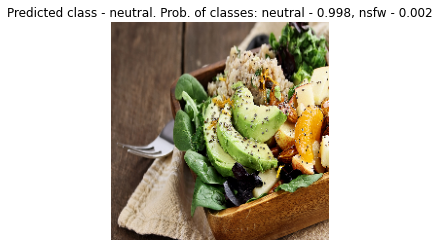

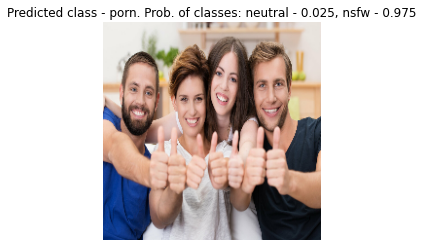

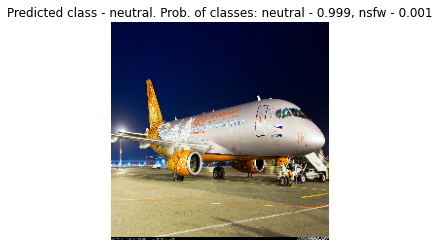

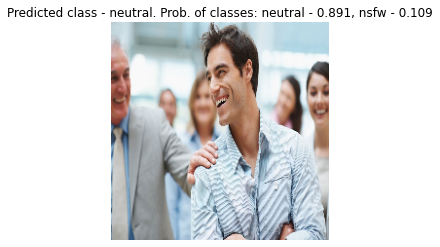

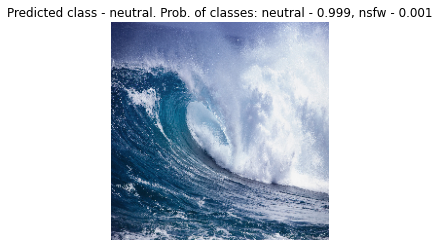

...

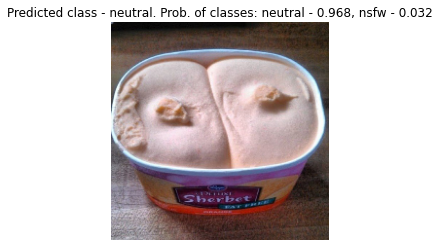

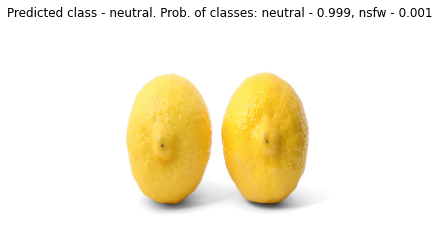

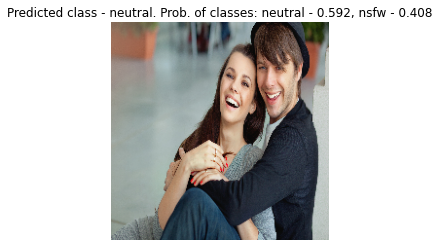

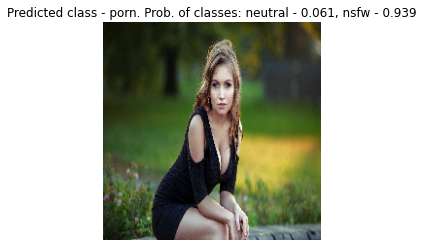

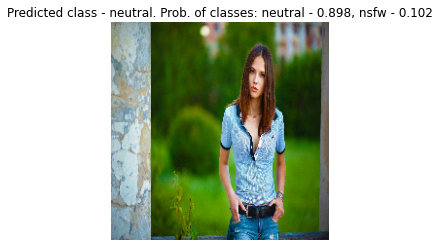

In [ ]:
inference_dir = '/content/drive/MyDrive/Colab Notebooks/nsfw_classification/inference/'
img_paths = [inference_dir + i for i in os.listdir(inference_dir) if i.startswith('img')]
for i in img_paths:
  img = np.array(Image.open(i).convert('RGB'))
  img = transform1(img / 255.0)
  with torch.no_grad():
    out = model_load(torch.tensor(img.unsqueeze(0)).float().to(device))
  probabilities = torch.nn.functional.softmax(out, dim=1)
  pred_lab = np.argmax(probabilities.cpu(), axis=1).numpy()[0]
  to_PIL = transforms.ToPILImage()
  plt.figure()
  plt.imshow(to_PIL(img))
  plt.title(f'Predicted class - {classes[pred_lab]}. Prob. of classes: neutral - {probabilities.tolist()[0][0]:.3f}, nsfw - {probabilities.tolist()[0][1]:.3f}')
  plt.axis('off')  
  plt.show()